# Исследование рынка общепита в Москве.

### Цель проекта: исследовать рынок общепита по имеющимся данным, найти особенности и закономерности, которые в будущем помогут в выборе подходящего инвесторам места.

### Задачи:
- Проанализировать заведения:
    - Количество объектов общественного питания по категориям.
    - Количество посадочных мест в местах по категориям.
    - Выявить соотношение соотношение сетевых и несетевых заведений.
- Определить топ-15 популярных сетей в Москве:
    - Выявить признак, который их объединяет.
    - Выявить категории заведений. 
- Геопозиционирование:
    - Вывксти административные районы Москвы в данных.
    - Отобразить общее количество заведений и количество заведений каждой категории по районам
    - Построить фоновую картограмму со средним рейтингом заведений каждого района.
    - Создать карту заведений с кластерами
- Определить улицы по плотности общепита:
    - Выявить топ-15 улиц по количеству заведений.
    - Выявить улицы, на которых находится только один объект общепита. 
- Исследовать показатели выручки:
    - Исследовать значения средних чеков заведений - расчитать медиану этого столбца для каждого района. 
    - Построить фоновую картограмму с ценовым идентификатором для каждого района.
    - определить,  как удалённость от центра влияет на цены в заведениях?
- Дополнительные характеристики:
    - Часы работы заведений и их зависимость от расположения и категории заведения
    - особенности заведений с плохими рейтингами и средний чек
    - средние чеки  и распределение по категориям заведений.
    
### Детализированное исследование: открытие кофейни

- Сколько всего кофеен в датасете? 
- В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?



In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go
import warnings
warnings.filterwarnings('ignore')
import json
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster
import numpy as np 

In [2]:
# установим параметры визуализации
sns.set(
    font_scale =1,
    style      ='whitegrid',
    rc         ={'figure.figsize':(15, 8)}
)
%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:,.2f}'.format

In [3]:
try:
    df = pd.read_csv('C://Users//эйч пи//Desktop//Учеба//Аналитик данных//jupyter notebook//projekts//kafe//moscow_places.csv')
except:     
    df = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
df.sample(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3709,Тото,"бар,паб","Москва, Столешников переулок, 7с3",Центральный административный округ,"ежедневно, 09:00–00:00",55.76,37.61,4.70,выше среднего,Средний счёт:1200 ₽,"1,200.00",NaN,0,NaN
3151,Хинкальная,кафе,"Москва, Береговой проезд, 5, стр. 1",Западный административный округ,"ежедневно, 12:00–00:00",55.76,37.51,4.50,NaN,NaN,NaN,NaN,1,140.00
5019,SeDelice,кофейня,"Москва, Таганская улица, 1, стр. 1",Центральный административный округ,пн-пт 07:30–23:00; сб 08:00–22:00; вс 09:00–21:00,55.74,37.66,4.20,NaN,NaN,NaN,NaN,1,100.00
2654,Pho Best,ресторан,"Москва, Измайловский проспект, владение 54",Восточный административный округ,"ежедневно, 09:00–21:00",55.79,37.79,4.10,средние,Средний счёт:350–700 ₽,525.00,NaN,0,NaN
4398,White Fox Cafe,пиццерия,"Москва, Подсосенский переулок, 8с2",Центральный административный округ,"ежедневно, 09:00–22:00",55.76,37.65,4.40,средние,Средний счёт:600–950 ₽,775.00,NaN,1,NaN
725,CHICKO,ресторан,"Москва, улица Декабристов, 12",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.86,37.60,4.70,средние,Средний счёт:750–1200 ₽,975.00,NaN,1,130.00
6333,Боорсок,кафе,"Москва, Автозаводская улица, 17к1",Южный административный округ,"ежедневно, 12:00–00:00",55.70,37.65,4.20,средние,Средний счёт:500–1500 ₽,"1,000.00",NaN,0,NaN
7814,Nashemesto,кофейня,"Москва, Бирюлёвская улица, 43",Южный административный округ,"ежедневно, 10:00–22:00",55.59,37.67,4.20,NaN,Цена чашки капучино:150–250 ₽,NaN,200.00,0,NaN
6833,Пекарня,кафе,"Москва, улица Бутлерова, 12, стр. 1",Юго-Западный административный округ,"ежедневно, круглосуточно",55.65,37.53,3.70,NaN,NaN,NaN,NaN,1,NaN
2694,Bb grill,"бар,паб","Москва, Семёновская площадь, 1",Восточный административный округ,"ежедневно, 12:00–23:00",55.78,37.72,4.60,высокие,Средний счёт:1500–2500 ₽,"2,000.00",NaN,0,100.00


#### Описание данных:
- name — название заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- address — адрес заведения;
- district — административный район, в котором находится заведение, например Центральный административный округ;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, 
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- seats — количество посадочных мест.


## Исследуем данные

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
df.isna().sum() # пропуски и дол пропусков.

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [7]:
pd.DataFrame(round(df.isna().mean()*100,1)).style.background_gradient('coolwarm') # доля пропусков

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


In [8]:
print('Выявлено полных дубликатов:', df.duplicated().sum())

Выявлено полных дубликатов: 0


In [9]:
df.duplicated(subset=['name', 'address']).sum() # проверим дубликаты по названию и адресу

0

In [10]:
df.category.unique() # проверим нет ли схожих названий в категориях

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
df['street'] = df.address.apply(lambda x: x.split(', ')[1]) # Добавим столбец улица
df[['address', 'street']]

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица
...,...,...
8401,"Москва, Профсоюзная улица, 56",Профсоюзная улица
8402,"Москва, Пролетарский проспект, 19, корп. 1",Пролетарский проспект
8403,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица
8404,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица


```python
data['address'].str.split(', ').str[1]
```

In [12]:
df['is_24/7'] = df['hours'].apply(lambda x: 
                    True if x =='ежедневно, круглосуточно' 
                    else False)
df[['hours', 'is_24/7']] # Добавим столбец 24/7

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True


##### Итоги подготовки данных:
- Названия столбцов соответствуют стилю
- Дубликатов полных не выявлено
- Дубликатов по адресам и названиям не выявлено
- Категории - нет дубликатов
- Пропуски в данных:
    - часы работв - 6,4% - не критично
    - категория цен - 60,6% - не используем в исследовании эти данные
    - средний счет - 54,6% - не используем в исследовании эти данные
    - средний чек - 62,5% - используем данные, которые есть - у кофеен нет этих данных
    - средняя стоимость чашки кофе - 93,6% - только для кофеен, используем для оценки средней по имеющимся данным
    - количество мест - 43% - используем для анализа по имеющимся данным
- Добаавлены два столбца:
    - Улица расположения объекта
    - Работает круглосуточно

## Анализ данных

### Анализ заведений по категории

In [13]:
df_types = df.pivot_table(index = 'category', values = ['name'], 
aggfunc = ['count']).astype('int64')
df_types.columns = ['Количество']
df_types['Доля, %'] = df_types['Количество'] / df_types['Количество'].sum()*100
df_types.sort_values(by='Количество', ascending=False)

,Количество,"Доля, %"
category,,
кафе,2378,28.29
ресторан,2043,24.30
кофейня,1413,16.81
"бар,паб",765,9.10
пиццерия,633,7.53
быстрое питание,603,7.17
столовая,315,3.75
булочная,256,3.05


In [14]:
df['category'] = df['category'].replace(0, 1)

df_category = pd.DataFrame(df['category'].value_counts()).reset_index()

fig = go.Figure(data=[go.Pie(labels=df_category['index'], 
                             values=df_category['category'],
                             pull = [0.1, 0])])
fig.update_layout(title='Категории объектов питания',
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

#### Основные категории объектов:
- Кафе
- Ресторан
- Кофейня

### Соотношение сетевых и несетевых объектов

In [15]:
df_chain = df.groupby('chain')['name'].count().sort_values()
df_chain

chain
1    3205
0    5201
Name: name, dtype: int64

In [16]:
df_chain = pd.DataFrame(df['chain'].value_counts()).reset_index()

fig = go.Figure(data=[go.Pie(labels=df_chain['index'], 
                             values=df_chain['chain'],
                             pull = [0.1, 0])])
fig.update_layout(title='Соотношение сетевых и несетевых объектов',
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Принадлежность к сети',
                                    showarrow=False)])
for trace in fig.data:
    trace['labels']=['Несетевые', 'Сетевые']
fig.show() 

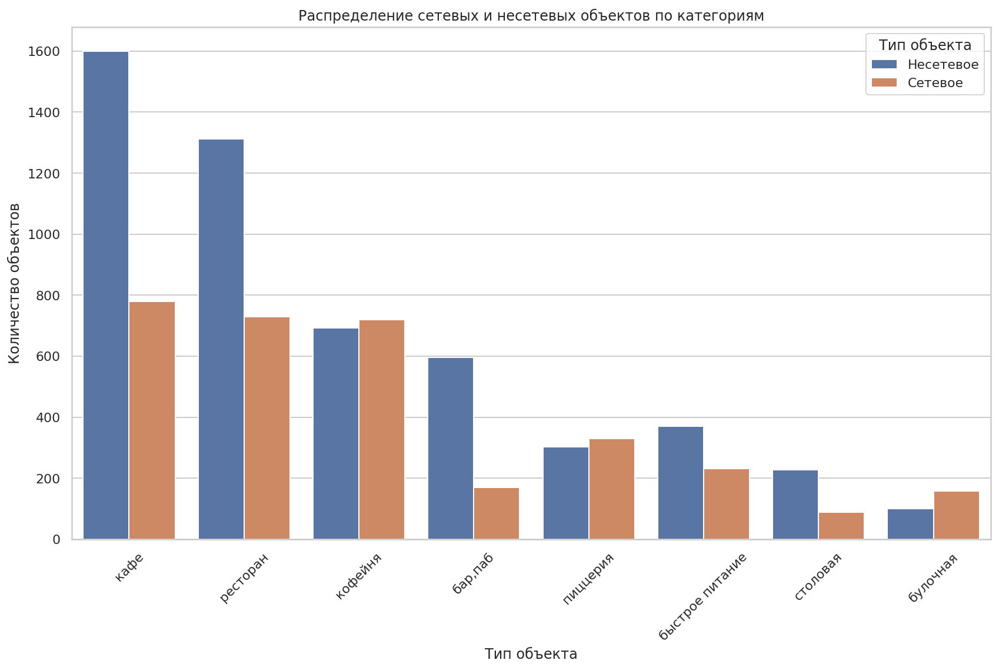

In [17]:
sorted_df = df.sort_values('category', ascending=False)
plt.figure(figsize=(14, 8))
ax = sns.countplot(x="category", hue = "chain", data = sorted_df,\
                  order = sorted_df['category'].value_counts().index)
plt.title('Распределение сетевых и несетевых объектов по категориям')
plt.xlabel('Тип объекта')
plt.ylabel('Количество объектов')
plt.xticks(rotation=45)
plt.legend(
    ['Несетевое', 'Сетевое'], 
    title='Тип объекта'
)

plt.show();

### Самая большая доля сетевых заведений  у булочных, кофеен и пиццерий - более половины.
#### Все остальные категории - сети занимают около 1/3 всех заведений.


### Исследуем количество посадочных мест

In [18]:
df['seats'].describe()

count   4,795.00
mean      108.42
std       122.83
min         0.00
25%        40.00
50%        75.00
75%       140.00
max     1,288.00
Name: seats, dtype: float64

#### Посмотрим на выбросы по количеству мест и удалим все, что более 400 мест (121 объект)

In [19]:
df.query('seats > 400').sort_values(by='seats', ascending=False)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.67,37.49,4.10,средние,Средний счёт:700 ₽,700.00,NaN,0,"1,288.00",проспект Вернадского,False
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.66,37.48,4.50,выше среднего,Средний счёт:1500 ₽,"1,500.00",NaN,1,"1,288.00",проспект Вернадского,False
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.67,37.48,3.60,NaN,NaN,NaN,NaN,0,"1,288.00",проспект Вернадского,False
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,NaN,55.67,37.48,4.70,NaN,NaN,NaN,NaN,1,"1,288.00",проспект Вернадского,False
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.66,37.48,4.40,NaN,NaN,NaN,NaN,1,"1,288.00",проспект Вернадского,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7740,"Ресторан, кафе, бар","бар,паб","Москва, Чертановская улица, 40, корп. 1",Южный административный округ,NaN,55.61,37.59,4.10,NaN,NaN,NaN,NaN,0,428.00,Чертановская улица,False
7594,Хочу шашлык,столовая,"Москва, Чертановская улица, 47, корп. 1",Южный административный округ,"ежедневно, 08:00–23:55",55.60,37.59,4.40,NaN,NaN,NaN,NaN,1,428.00,Чертановская улица,False
6975,Додо Пицца,пиццерия,"Москва, Чертановская улица, 12, корп. 1",Южный административный округ,"ежедневно, 10:00–23:00",55.63,37.60,4.70,NaN,Средний счёт:301 ₽,301.00,NaN,1,428.00,Чертановская улица,False
7761,Pratto Pizza,ресторан,"Москва, Чертановская улица, 40, корп. 1",Южный административный округ,"ежедневно, круглосуточно",55.61,37.59,3.30,NaN,NaN,NaN,NaN,0,428.00,Чертановская улица,True


In [20]:
df_seats = df.query('seats < 400 & category != "булочная"').sort_values(by='seats', ascending=False)

In [21]:
df_seats['seats'].describe()

count   4,517.00
mean       94.49
std        79.78
min         0.00
25%        40.00
50%        70.00
75%       120.00
max       398.00
Name: seats, dtype: float64

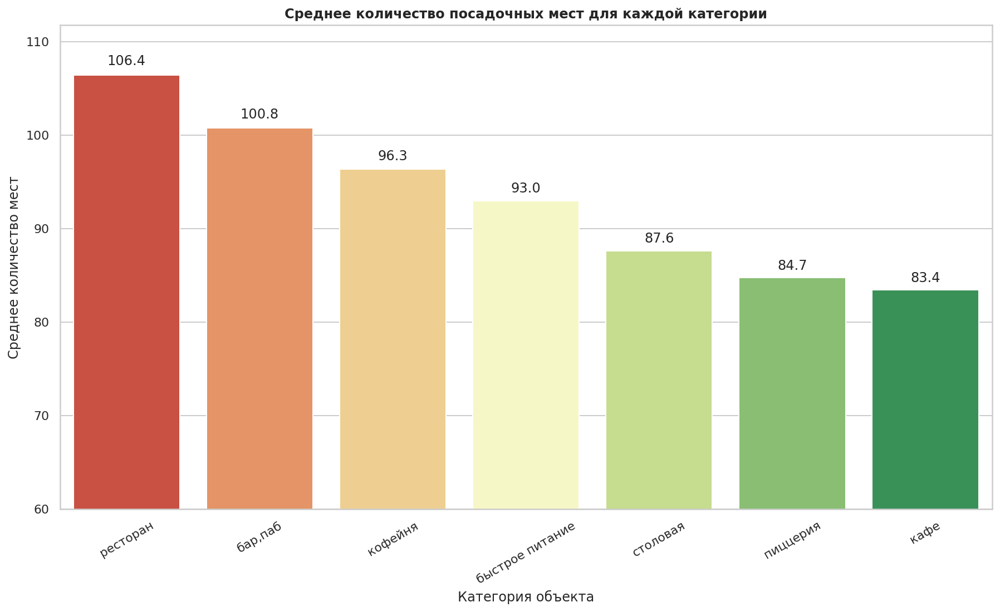

In [22]:
df_seats_mean = df_seats.groupby('category').agg({'seats':'mean'}).sort_values(by='seats', ascending=False).reset_index()
                                                
sns.set_style("whitegrid")
#g = sns.barplot(data=df_seats_mean, x='category', y='seats', palette='RdYlGn')
g = sns.barplot(x='category', y='seats',
                 palette='RdYlGn', data=df_seats_mean,
                 errwidth=0)
g.set_xticklabels(g.get_xticklabels(), rotation=30)
g.set_ylim(60)
g.set_title('Среднее количество посадочных мест для каждой категории', fontweight="bold")
g.set_xlabel('Категория объекта')
g.set_ylabel('Среднее количество мест');

for p in g.patches:
    _x = p.get_x() + p.get_width() / 2
    _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
    value = '{:.1f}'.format(p.get_height())
    g.text(_x, _y, value, ha="center")


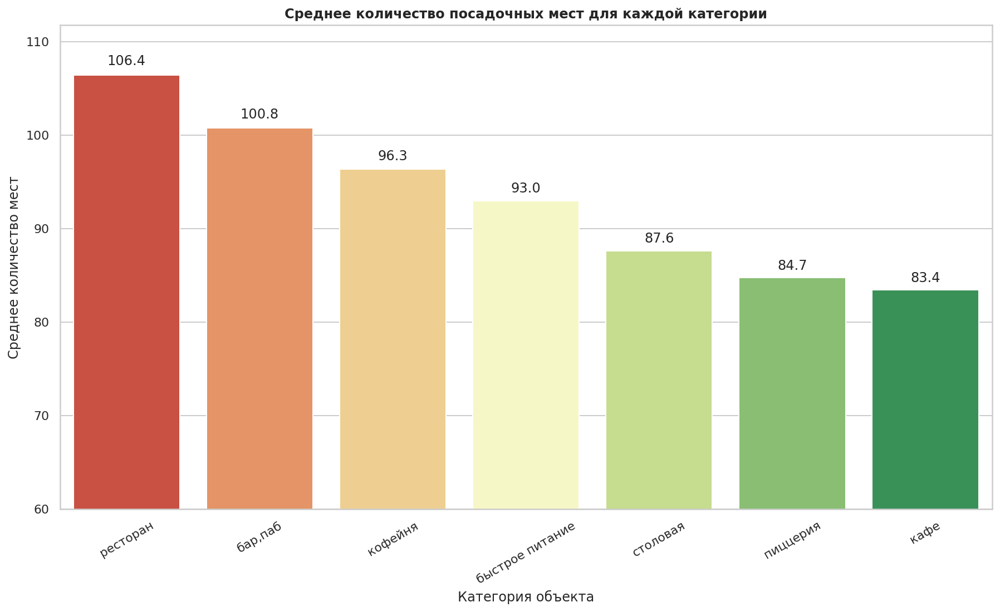

In [23]:
df_seats_mean = df_seats.groupby('category').agg({'seats':'mean'}).sort_values(by='seats', ascending=False).reset_index()
                                                
sns.set_style("whitegrid")
g = sns.barplot(data=df_seats_mean, x='category', y='seats', palette='RdYlGn')


g.set_xticklabels(g.get_xticklabels(), rotation=30)
g.set_ylim(60)
g.set_title('Среднее количество посадочных мест для каждой категории', fontweight="bold")
g.set_xlabel('Категория объекта')
g.set_ylabel('Среднее количество мест')

for p in g.patches:
    _x = p.get_x() + p.get_width() / 2
    _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
    value = '{:.1f}'.format(p.get_height())
    g.text(_x, _y, value, ha="center")




#### Среднее количество посадочных мест от 80 до 105. Рестораны первосходят все категории по количеству мест.


In [24]:
df_chain_seats = df_seats.query('chain == 1').groupby('name').agg({'name':'count', 'seats':'mean'})
df_chain_seats.columns = ['total','seats_mean']
df_chain_seats

,total,seats_mean
name,,
1-я Креветочная,1,0.00
10 Идеальных Пицц,2,130.00
18 Грамм,1,252.00
7 Сэндвичей,2,44.00
8 Вафель,2,104.00
...,...,...
Юрта,2,52.00
Я люблю суши,2,134.00
Ян Примус,1,210.00


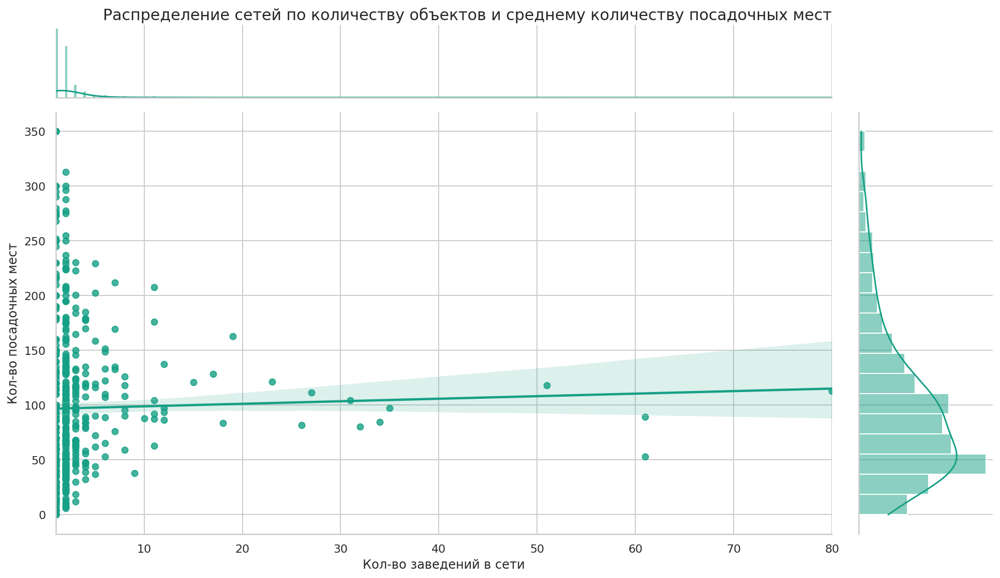

In [25]:
g = sns.jointplot(data=df_chain_seats, x='total', y='seats_mean', kind='reg', color='#16a085')
g.fig.set_figwidth(15)
g.fig.set_figheight(8)
g.ax_joint.set_ylabel('Кол-во посадочных мест')
g.ax_joint.set_xlabel('Кол-во заведений в сети')
g.fig.suptitle('Распределение сетей по количеству объектов и среднему количеству посадочных мест',
               y = 1,
               fontsize = 15);

#### Сетевые объекты - размер сети и  расределение по количеству мест:
- Преобладают небольшие сети - до 10 объектов
- Больше всего 2-5 заведений
- Есть несколько крупных сетей - ниже разберем
- По посадочным местам реобладают объекты с количествомот 40 до 50 мест
- От 100 мест - небольшое количество объектов

### Топ-15 популярных сетей

In [26]:
df_chain = df.loc[df['chain'] ==1].reset_index() # Подготовим данные по сетевым объектам

In [27]:
print('Всего сетей разных размеров:', df_chain_seats['total'].count())
print('Всего сетевых заведений:',  df_chain_seats['total'].sum())

Всего сетей разных размеров: 608
Всего сетевых заведений: 1781


In [28]:
df_chain_top=df_chain.groupby(['name','category'])['address'].count().sort_values(ascending=False).reset_index(level=1).head(15)
df_chain_top=df_chain_top.reset_index()
df_chain_top.columns = ['Наименование','Категория','Количество']
df_chain_top


,Наименование,Категория,Количество
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


In [29]:
fig = px.bar(df_chain_top, x='Наименование', y='Количество', color='Категория', title='Топ-15 сетей по категориям')
fig.update_xaxes(tickangle=45)

fig.show() 

#### Топ-15 сетей в основном представлены кофейнями. Так же пиццерии и рестораны быстрого питания. И одна сетевая Булочная.

### Как распеделены заведения по округам Москвы

In [30]:
df_cat_district=df.query('chain == 1').groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index()
df_cat_district=df_cat_district.rename(columns={'name':'total'}) 

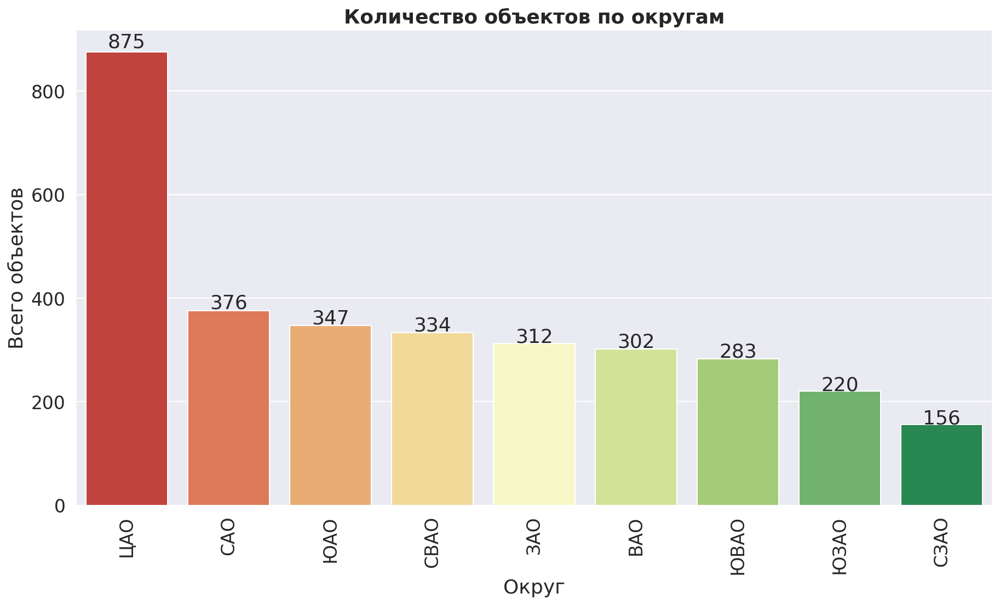

In [31]:
sns.set (font_scale= 1.5 )
g = sns.barplot(data=df_cat_district, x='district', y='total', palette='RdYlGn')
g.set_xticklabels(g.get_xticklabels(), rotation=90)
g.set_title('Количество объектов по округам', fontweight="bold")
g.set_xlabel('Округ')
g.set_ylabel('Всего объектов')
g.set_xticklabels(['ЦАО', 'САО', 'ЮАО', 'СВАО', 'ЗАО', 'ВАО', 'ЮВАО', 'ЮЗАО', 'СЗАО'])

for p in g.patches:
    _x = p.get_x() + p.get_width() / 2
    _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
    value = '{:.0f}'.format(p.get_height())
    g.text(_x, _y, value, ha="center")

In [32]:
df_chain_pivot=df_chain.pivot_table(index = 'district', columns = 'category', \
                        values = 'name', aggfunc = 'count')
df_chain_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,11,9,28,73,51,38,63,10
Западный административный округ,8,25,33,85,93,38,90,4
Северный административный округ,20,25,20,66,97,40,66,13
Северо-Восточный административный округ,18,18,27,83,79,36,61,12
Северо-Западный административный округ,2,10,13,35,34,22,37,3
Центральный административный округ,73,39,34,218,221,48,217,25
Юго-Восточный административный округ,10,5,23,80,29,29,41,3
Юго-Западный административный округ,11,15,30,80,50,38,72,6
Южный административный округ,16,11,24,59,66,41,83,12


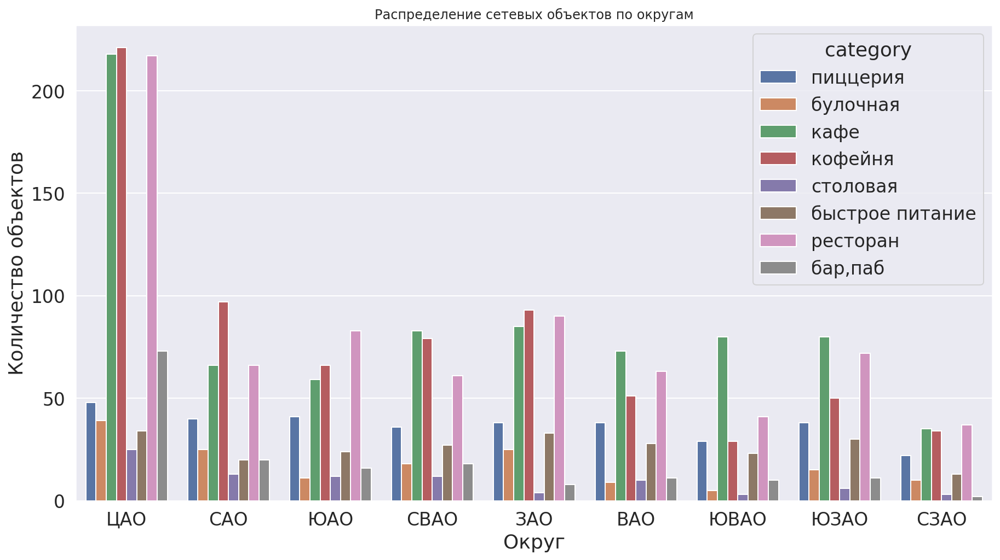

In [33]:
ax = sns.countplot(x="district", hue = "category", data = df_chain,\
                  order = sorted_df['district'].value_counts().index)
sns.set (font_scale= 1 )
plt.title('Распределение сетевых объектов по округам')
plt.xlabel('Округ')
plt.ylabel('Количество объектов')
ax.set_xticklabels(['ЦАО', 'САО', 'ЮАО', 'СВАО', 'ЗАО', 'ВАО', 'ЮВАО', 'ЮЗАО', 'СЗАО'])
#plt.xticks(rotation=60)

plt.show();

#### Ожидаемо впереди центральный округ. Он превышает все более, чем в 2 раза по количеству объектов.
- В центральном округе преобладают кофейни, кафе и рестораны
- Это лидерство трех категорий присутствует и в других округах
- В запдном, восточном и юго-восточном округах преобладают кафе

### Рейтинги заведений

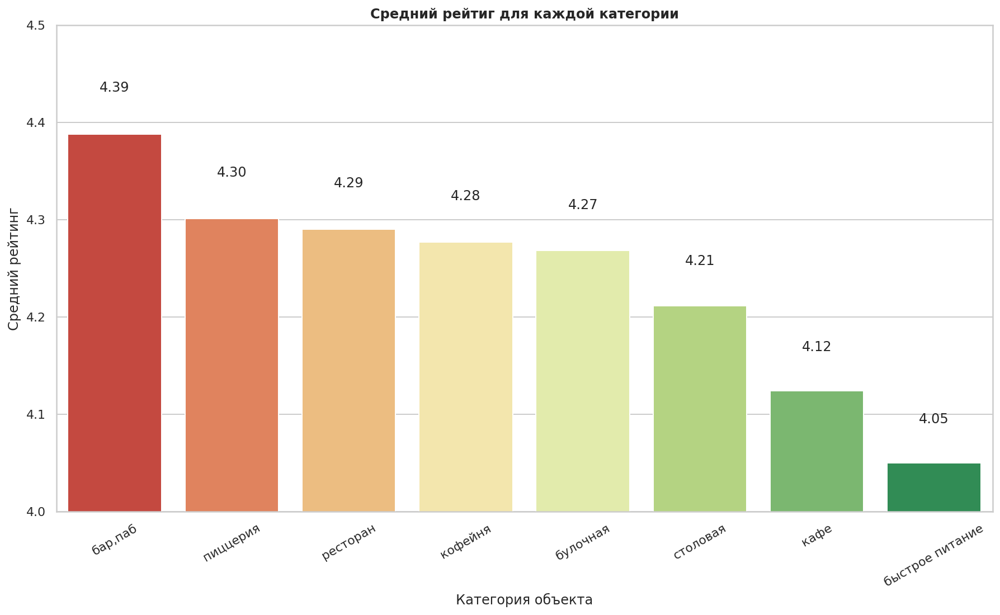

In [34]:
df_rating_mean = df.groupby('category').agg({'rating':'mean'}).sort_values(by='rating', ascending=False).reset_index()


sns.set_style("whitegrid")
g = sns.barplot(data=df_rating_mean, x='category', y='rating', palette='RdYlGn')
g.set_xticklabels(g.get_xticklabels(), rotation=30)
g.set_ylim(4, 4.5)
g.set_title('Средний рейтиг для каждой категории', fontweight="bold")
g.set_xlabel('Категория объекта')
g.set_ylabel('Средний рейтинг')

for p in g.patches:
    _x = p.get_x() + p.get_width() / 2
    _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
    value = '{:.2f}'.format(p.get_height())
    g.text(_x, _y, value, ha="center")


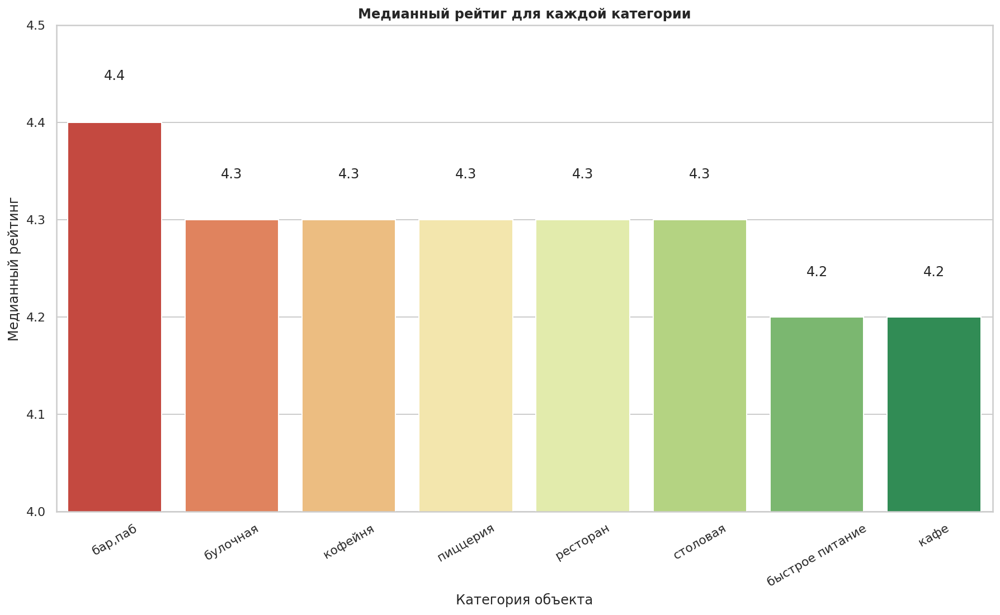

In [35]:
df_rating_median = df.groupby('category').agg({'rating':'median'}).sort_values(by='rating', ascending=False).reset_index()


sns.set_style("whitegrid")
g = sns.barplot(data=df_rating_median, x='category', y='rating', palette='RdYlGn')
g.set_xticklabels(g.get_xticklabels(), rotation=30)
g.set_ylim(4, 4.5)
g.set_title('Медианный рейтиг для каждой категории', fontweight="bold")
g.set_xlabel('Категория объекта')
g.set_ylabel('Медианный рейтинг')

for p in g.patches:
    _x = p.get_x() + p.get_width() / 2
    _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
    value = '{:.1f}'.format(p.get_height())
    g.text(_x, _y, value, ha="center")


#### Средние рейтинги и медианные выше у баров/пабов - 4,4 оба показателя, а вот у остальных разнятся.
- нет среднего рейтинга ниже 4 баллов.
- нет медианного рейтинга ниже 4,2 балла.

### Особенности объектов по округам Москвы

In [36]:
try:
    with open('C:/Users/эйч пи/Desktop/Учеба/Аналитик данных/jupyter notebook/projekts/kafe/admin_level_geomap.geojson', 'r')as f:
        geo_json = json.load(f)
except:   
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)


In [37]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m

#### Средний рейтинг по районам Москвы

In [38]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')

In [39]:
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except: 
    state_geo = 'C:/Users/эйч пи/Desktop/Учеба/Аналитик данных/jupyter notebook/projekts/kafe/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

#### Ожидаемо высокие рейтинги в центре Москвы.

### Медианный средний чек по районам

In [40]:
median_bill_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

In [41]:
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except: 
    state_geo = 'C:/Users/эйч пи/Desktop/Учеба/Аналитик данных/jupyter notebook/projekts/kafe/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=median_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.5,
    legend_name='Медианный средний чек по районам',
).add_to(m)

# выводим карту
m

#### Медианный средний чек тоже высокий в центре Москвы, а так же по юго-западному направлению, вплоть до Внуково.

### Топ-15 улиц по количеству заведений

In [42]:
top_streets = df.groupby('street', as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False).head(15)
top_streets

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


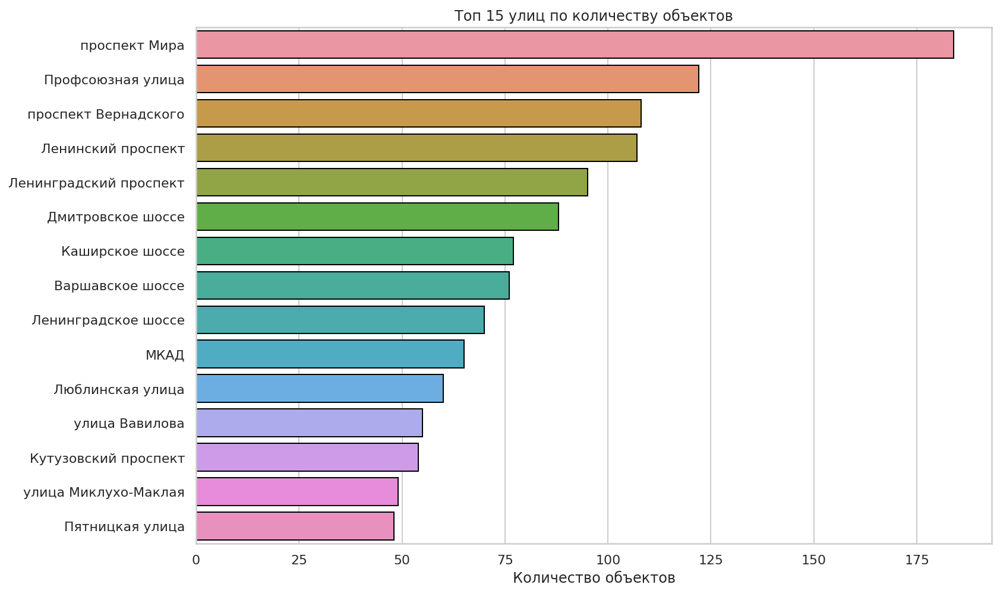

In [43]:
plt.figure(figsize=[12, 8])

chain_types_hist = sns.barplot(
    x='name',
    y='street',
    orient='h',
    data=top_streets,
    edgecolor = "black",
)

chain_types_hist.set(
    title='Топ 15 улиц по количеству объектов', 
    xlabel='Количество объектов',
    ylabel=''
)

plt.show()

#### Улицы с 1 объектом

In [44]:
streets_one_object = df.groupby('street', as_index=False).agg({'address': 'count', 'category':'sum', 'name':'sum'})
streets_one_object = streets_one_object[streets_one_object['address'] == 1]
streets_one_object

,street,address,category,name
0,1-й Автозаводский проезд,1,кафе,Чайхана Азия
1,1-й Балтийский переулок,1,ресторан,Хуан Хэ
2,1-й Варшавский проезд,1,кафе,Колизей
3,1-й Вешняковский проезд,1,кафе,Deli by Shell
5,1-й Голутвинский переулок,1,"бар,паб",Shelby
...,...,...,...,...
1436,улица Шкулёва,1,ресторан,Мираж
1437,улица Шкулёва 4,1,кофейня,CofeFest
1439,улица Шухова,1,ресторан,Scirocco
1442,улица Юннатов,1,столовая,Кафе-столовая


#### Улицы с 1 объектом - это  небольшие улицы в спальных районах, боковые улицы у магистралей, проезды.

##### Взаимосвязь среднего чека и рейтинга

In [45]:
print('Средний чек по всем объектам:', df['middle_avg_bill'].mean().round(2))

Средний чек по всем объектам: 958.05


In [46]:
df_midl = df.loc[df['rating'] <4]
print ('Средний чек по объектам с низким рейтингом:', df_midl['middle_avg_bill'].mean().round(2))

Средний чек по объектам с низким рейтингом: 544.26


In [47]:
df_rating_bill_5 = df.loc[df['rating'] >4].reset_index()
df_rating_bill_5=df.pivot_table(index = 'district', columns = 'category', \
                        values = 'middle_avg_bill', aggfunc = 'mean')
df_rating_bill_5

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,"1,209.04",263.89,831.73,607.94,486.11,700.73,"1,221.46",364.70
Западный административный округ,"1,305.56",723.12,432.33,826.84,694.44,905.07,"1,478.23",565.00
Северный административный округ,"1,572.81",625.00,327.13,723.82,495.74,722.62,"1,312.78",337.50
Северо-Восточный административный округ,986.91,515.71,435.66,673.70,433.16,579.46,"1,024.57",325.24
Северо-Западный административный округ,"1,057.14",200.00,295.00,797.97,440.64,682.58,"1,235.83",298.64
Центральный административный округ,"1,479.74","1,237.92",532.08,765.18,794.76,"1,104.84","1,561.06",319.89
Юго-Восточный административный округ,"1,043.18",375.00,479.14,589.21,263.00,561.60,931.63,288.93
Юго-Западный административный округ,995.53,556.67,411.32,594.66,381.82,786.66,"1,117.36",311.67
Южный административный округ,"1,079.11",458.33,376.92,696.53,504.78,662.93,"1,393.33",291.39


In [48]:
df_rating_bill_4 = df.loc[df['rating'] <4].reset_index()

df_rating_bill_4=df_rating_bill_4.pivot_table(index = 'district', columns = 'category', \
                        values = 'middle_avg_bill', aggfunc = 'mean')
df_rating_bill_4

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,750.00,266.67,316.33,548.33,237.50,400.00,583.33,700.00
Западный административный округ,800.00,NaN,342.27,"1,218.33",500.00,878.33,300.00,NaN
Северный административный округ,365.00,450.00,365.00,365.00,300.00,690.00,975.00,245.00
Северо-Восточный административный округ,150.00,550.00,478.33,685.62,657.50,506.67,470.00,445.00
Северо-Западный административный округ,NaN,NaN,290.00,862.50,260.00,NaN,"2,375.00",305.00
Центральный административный округ,"1,250.00",NaN,570.00,643.33,NaN,750.00,981.25,400.00
Юго-Восточный административный округ,NaN,350.00,237.50,535.91,230.00,"1,500.00",750.00,286.67
Юго-Западный административный округ,NaN,325.00,297.50,597.08,NaN,400.00,510.00,NaN
Южный административный округ,NaN,562.50,293.57,660.56,550.00,413.67,455.00,302.00


#### Тенденция прямой зависимости среднего чека и рейтинга по всем категориям и всем районам города. Кроме булочных и столовых.

#### Средний чек по сумме самый высокий в барах/пабах и ресторанах

## Детализированное исследование кофеен

In [49]:
df_coffee = df.loc[df['category'] == 'кофейня'].reset_index()
df_coffee.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,False
1,25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
2,45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,NaN,NaN,NaN,NaN,1,46.00,Коровинское шоссе,False
3,46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
4,52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.48,3.80,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False


In [50]:
print('Всего кофеен:', df_coffee['name'].count() )

Всего кофеен: 1413


In [51]:
df_coffee_dist = df_coffee.groupby('district', as_index=False).agg({'name':'count', 'is_24/7':'sum'}).sort_values(by='name', ascending=False)
df_coffee_dist.columns=['district','total', 'is_24/7']

df_coffee_dist

,district,total,is_24/7
5,Центральный административный округ,428,26
2,Северный административный округ,193,5
3,Северо-Восточный административный округ,159,3
1,Западный административный округ,150,9
8,Южный административный округ,131,1
0,Восточный административный округ,105,5
7,Юго-Западный административный округ,96,7
6,Юго-Восточный административный округ,89,1
4,Северо-Западный административный округ,62,2


#### Количество кофеен по округам

In [52]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df_coffee.apply(create_clusters, axis=1)

m


#### Средний рейтинг кофеен по округам

In [53]:
df_coffee_rating = df_coffee.groupby('district', as_index=False)['rating'].agg('mean')

In [54]:
# Средний рейтинг кофеен по районам

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)


m

In [55]:
df_coffee['middle_coffee_cup'].describe().round(2)

count     521.00
mean      175.06
std        89.75
min        60.00
25%       124.00
50%       170.00
75%       225.00
max     1,568.00
Name: middle_coffee_cup, dtype: float64

In [56]:
# Посмотрим самые дорогие кофейни
df_coffee.query('middle_coffee_cup > 200').sort_values(by='middle_coffee_cup', ascending=False).head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
535,2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,"1,568.00",1,48.00,Большая Семёновская улица,False
1012,5503,Coffee FM,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.75,37.72,4.30,NaN,Цена чашки капучино:250–500 ₽,NaN,375.00,0,190.00,Авиамоторная улица,False
674,3718,Кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.76,37.60,4.30,средние,Цена чашки капучино:279–378 ₽,NaN,328.00,1,30.00,Большая Никитская улица,False
302,1769,Шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.81,37.58,4.10,средние,Цена чашки капучино:300–350 ₽,NaN,325.00,1,61.00,Бутырская улица,False
1089,5990,Диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.72,37.58,4.30,средние,Цена чашки капучино:250–390 ₽,NaN,320.00,0,30.00,3-я Фрунзенская улица,False


In [57]:
df_coffee.drop(df_coffee[df_coffee['middle_coffee_cup'] > 400].index, inplace = True)
#удалил кофейню с ошибочной стоимостью чашки кофе в 1568 р., чтобы не влияла на среднее

#### Средняя цена чашечки кофе капучино по округам

In [58]:
df_coffee_cup = df_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')

In [59]:
# Средняя цена чашки кофе по районам Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=df_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

m

In [60]:
top_streets_coffee = df_coffee.groupby('street', as_index=False).\
            agg({'name':'count'}).sort_values(by='name', ascending=False).head(15)
top_streets_coffee

,street,name
476,проспект Мира,36
212,Ленинградский проспект,25
214,Ленинский проспект,23
331,Профсоюзная улица,18
474,проспект Вернадского,16
178,Каширское шоссе,16
120,Варшавское шоссе,14
207,Кутузовский проспект,13
284,Новослободская улица,13
213,Ленинградское шоссе,13


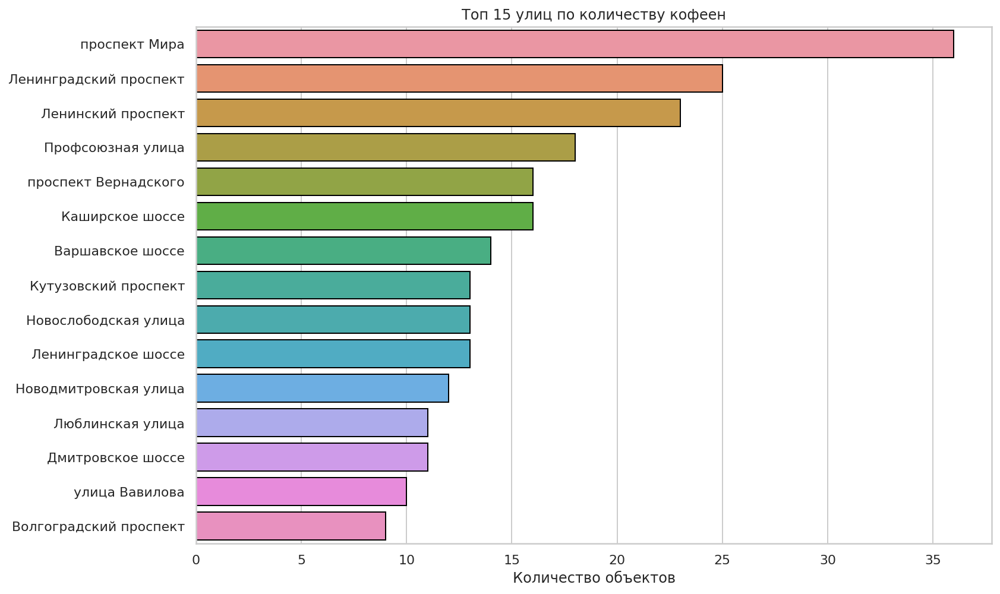

In [61]:
plt.figure(figsize=[12, 8])

chain_types_hist = sns.barplot(
    x='name',
    y='street',
    orient='h',
    data=top_streets_coffee,
    edgecolor = "black",
)

chain_types_hist.set(
    title='Топ 15 улиц по количеству кофеен', 
    xlabel='Количество объектов',
    ylabel=''
)

plt.show()

In [62]:
df_coffee_svod = df_coffee.groupby('district', as_index=False).\
        agg({'name':'count', 'is_24/7':'sum', 'middle_coffee_cup':'mean', 'rating':'mean', 'seats':'median'}).\
        sort_values(by='name', ascending=False)
df_coffee_svod.columns=['district','total', 'is_24/7', 'mean_coffee_cup', 'mean_rating', 'seats_median']

df_coffee_svod

,district,total,is_24/7,mean_coffee_cup,mean_rating,seats_median
5,Центральный административный округ,428,26,187.52,4.34,86.00
2,Северный административный округ,193,5,165.79,4.29,66.00
3,Северо-Восточный административный округ,159,3,165.33,4.22,75.00
1,Западный административный округ,150,9,189.94,4.20,96.00
8,Южный административный округ,131,1,158.49,4.23,80.00
0,Восточный административный округ,104,5,140.02,4.28,55.00
7,Юго-Западный административный округ,96,7,184.18,4.28,64.50
6,Юго-Восточный административный округ,89,1,151.09,4.23,50.00
4,Северо-Западный административный округ,62,2,165.52,4.33,87.50


#### Самые насыщенные кофейнями магистрали города. Это обусловлено большим трафиком.

In [63]:
name_top_15=df.groupby('name').agg('count').sort_values(by='address',ascending=False)\
.query('name !="Кафе" and name != "Ресторан" and name !="Шаурма" and name !="Чайхана" and name !="Хинкальная" and name !="Столовая"')\
.reset_index().head(15)
name_top_15

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,Шоколадница,120,120,120,120,120,120,120,52,74,12,62,120,83,120,120
1,Домино'с Пицца,76,76,76,76,76,76,76,39,35,35,0,76,61,76,76
2,Додо Пицца,74,74,74,74,74,74,74,8,72,72,0,74,62,74,74
3,One Price Coffee,71,71,71,71,71,71,71,1,6,0,6,71,52,71,71
4,Яндекс Лавка,69,69,69,68,69,69,69,0,0,0,0,69,35,69,69
5,Cofix,65,65,65,65,65,65,65,7,35,0,35,65,36,65,65
6,Prime,50,50,50,50,50,50,50,24,25,25,0,50,33,50,50
7,КОФЕПОРТ,42,42,42,42,42,42,42,1,30,0,30,42,23,42,42
8,Кулинарная лавка братьев Караваевых,39,39,39,39,39,39,39,28,29,29,0,39,27,39,39
9,Теремок,38,38,38,38,38,38,38,20,23,23,0,38,27,38,38


## Выводы и рекомендации.
- Кафе самая распространенная категория среди объектов общепита в Москве, 28,3% всего рынка. В тройку входят Рестораны и кафе. Столовые, булочные от 3% до 4%.
- Доля не сетевых заведений больше сетевых 61,9% рынка.
- Сетевое распрастранение более представлено в категориях Рестораны, кафе и кофейни по абсолютному показателю и кофейня, пиццерия и булочная по доле.
- Для сетевых заведений характерно: небольшое количество объектов (около 5-10) с кол-ом посадочных мест около 40.
- Есть крумпные сети с количеством объектов более 50 - кофейни и пиццерии.
- Районы по количеству объектов неравномерны - основное сосредоточение в центре и по направлению на юго-запад в сторону Новой Риги. 
- Средний и медианный рейтинг по всем категориям больше 4. Лучший рейтинг у баров/пабов - посетители их, вероятно, менее требовательные.
- Средний рейтинг по районам - самый высокий в центре, второй - северо-западный и северный округа, остальные примерно на обдном уровне. Самый низкий - Люблино и Капотня - там небольшая концентрация заведений и много промзон.
- Медианный средний чек по районам города - центр и Новорижское направление самые высокие чеки. Капотня и Люблино  - самые низкие.

- Улицы, на которых расположено много объектов общепита - центральные и вылетные магистрали.
- Улицы с 1 объектом - это  небольшие улицы в спальных районах, боковые улицы у магистралей, проезды. 458 объектов.
- Рейтинг и средний чек имеют прослеживаемую связь. При низких чеках объект не сильно заботится о рейтинге.

### Кофейни
- Всего 1413 кофеен
- Половина кофеен - сетевые с разным размером сети
- Крупных сетей - более 20 объектов - 6. Самая крупная - Шоколадница (120 объектов).
- Кофейни распределены по городу относительно равномерно, кроме пика в центральном округе. Меньше объектов в Юго-западном, Юго-восточном и Северо-западном округах.
- Средний рейтинг кофеен 4,28, очень сильно зависит округа - самый высокий в центре и северо-запад.
- Средняя стоимость чашечки капучино колеблется от 140 до 190 рублей. Самая высокая цена в центре, до400 рублей, самая низкая Северо-восточный и Восточный округа.
- Самое большое количество коффеен на вылетных магистралях, причина - высокий трафик и протяженность.

## Рекомендации
 - открывать заведение в центре, направление Новой Риги, вылетные магистрали
 - близость конкурентов не должна смущать - новое заведение привлекает, при высоком трафике всегда есть клиенты
 - открывать предпочтительнее бар/паб, кафе, кофейню
 - количество посадочных мест от 40 до 100
 - кофейню открывать желательно в районе деловых центров или в центре.


### Ссылка на презентацию: 

https://drive.google.com/file/d/1mGFkPDmLIVnluEYJMphl17z8d_axHZRo/view?usp=sharing